# Reconociendo el Canto de las Aves: Entrenando un Modelo de Machine Learning con Espectrogramas para Identificar Especies Aviarias

### Resumen

### Marco Teórico

Las Redes Neuronales Convolucionales (CNN) son un tipo de arquitectura de redes neuronales profundas diseñadas específicamente para el procesamiento de datos bidimensionales, como imágenes y vídeos. Han demostrado un rendimiento sobresaliente en una amplia variedad de tareas relacionadas con la visión por computadora. Estas redes revolucionaron el procesamiento de datos al aprender directamente las características relevantes de los datos durante el entrenamiento, en lugar de depender de la extracción manual de características. El nombre "convolucional" proviene de la operación central en la primera capa de estas redes, la convolución. Este enfoque demostró su éxito inicial en tareas como el procesamiento de imágenes y datos similares.

* Necesidad de las convoluciones: 

En muchas aplicaciones, trabajar directamente con los datos en bruto hace que la tarea sea sencillamente inmanejable. Tomemos el ejemplo de una imagen de matriz 256x256 píxeles, tendríamos un vector de entrada de 65.536 dimensiones. Esto significa que habría aproximadamente 65 millones de parámetros que conectarían cada píxel de entrada con cada nodo de la primera capa, lo que resultaría en una red extremadamente grande y difícil de entrenar. 

La complejidad aumenta aún más con imágenes de alta resolución, como 1000x1000 píxeles, y aún más si se trata de imágenes en color con una representación RGB, ya que cada píxel tendría tres valores (rojo, verde y azul), lo que triplicaría la dimensionalidad de la entrada.



```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/ffff.jpg
---
height: 250px
name: directive-fig
---
Estructura de una imagen
```


Además, a medida que se añaden capas ocultas, el número de parámetros sigue aumentando. Mientras que al emplear convoluciones, se pueden abordar simultáneamente ambos problemas, es decir, el de la explosión de parámetros y el de la extracción de información estadística útil.

#### Características

- Convolución:  Se realiza en la primera capa de estas redes en lugar del producto interno (también conocido como multiplicación de matrices) que se usaba en las redes neuronales totalmente conectadas o feedforward, anteriormente.

- No solo aprenden los parámetros de la red (los pesos y sesgos de las neuronas) durante el entrenamiento, sino que también aprenden las características directamente de los datos (La red es capaz de identificar automáticamente patrones y características relevantes en los datos sin necesidad de una etapa de preprocesamiento intensiva). 

#### Pasos básicos de una red convolucional

Los pasos básicos de cualquier red convolucional son:

- Etapa de convolución
- El paso de no linealidad
- El paso de agrupación 

#### Etapa de convolución


```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/convolucion_1.png
---
height: 200px
name: directive-fig
---
Convolución: Reparto de pesos
```

La operación de convolución entre dos matrices $H \in R^{mxm}$ e  $I \in R^{lxl}$ , es otra matriz definida por:


```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/formula.png
---
height: 50px
name: directive-fig
---

```


El resultado anterior se obtiene si colocamos la matriz $H$ de (2 x 2) sobre $I$, empezando por la esquina superior izquierda. Desde un punto de vista físico, el valor $O(1,1)$ resultante es una media ponderada sobre un área local dentro de la matriz $I$

<div style="text-align: center;">

$O(1,1)=h(1,1)I(1,1)+h(1,2)I(1,2)+h(2,1)I(2,1)+h(2,2)I(2,2)$

$O(1,2)=h(1,1)I(1,2)+h(1,2)I(1,3)+h(2,1)I(2,2)+h(2,2)I(2,3)$

$O(2,1)=h(1,1)I(2,1)+h(1,3)I(2,2)+h(2,1)I(3,1)+h(2,2)I(3,2)$

$O(2,2)=h(1,1)I(2,2)+h(1,3)I(2,3)+h(2,1)I(3,2)+h(2,2)I(3,3)$
    
</div> 

La operación anterior se  conoce como operación de correlación cruzada: operaciones ponderadas sobre los píxeles dentro de un área de ventana de una imagen. se tiene que:

- En otras palabras, $O(i,j)$ contiene información en un área de ventana de la matriz de entrada. 

- El elemento $I(i,j)$ es el elemento superior izquierdo de esta área de la ventana.

- El tamaño de la matriz de salida depende de las suposiciones que se adopten sobre cómo tratar los elementos/píxeles en los bordes de I

- El tamaño de la ventana depende del valor de $m$ 

- Ejemplo:


```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/w.png
---
height: 200px
name: directive-fig
---
Ejemplo de convolución
```

Estas operaciones de filtrado se han utilizado tradicionalmente para generar características a partir de imágenes. La diferencia era que los elementos de la matriz de filtrado se preseleccionaban. 

In [96]:
from skimage.color import rgb2gray
#Esta función se utiliza para convertir imágenes en color en imágenes en escala de grises.
from skimage.io import imread
# Importa la función imread de la biblioteca scikit-image. Esta función se utiliza para cargar imágenes desde archivos en diversos formatos.
import numpy as np
from scipy import signal
#biblioteca científica que proporciona herramientas para diversas aplicaciones numéricas, incluyendo procesamiento de señales.
import matplotlib.pylab as pylab
#módulo que combina características de NumPy y Matplotlib para una experiencia de usuario similar a la de MATLAB.

# La conversión a tipo flotante puede ser útil si se planea realizar cálculos numéricos o procesamiento de imagen que requieran valores en coma flotante.
im = rgb2gray(imread('C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/fotografo.jpeg')).astype(float)

#Esto imprime el valor máximo dentro de la matriz im, que representa el valor de intensidad más alto presente en la imagen.
# #Si la imagen está en escala de grises, este valor generalmente estará en el rango de 0 a 255,
# #donde 0 representa el negro y 255 representa el blanco en una representación de 8 bits
print(im.shape, np.max(im))

(276, 183) 1.0


In [97]:
#Este tipo de kernel se utiliza comúnmente para aplicar un filtro de promedio o desenfoque en una imagen
blur_box_kernel = np.ones((3,3)) / 9
blur_box_kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [98]:
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
edge_laplace_kernel

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

In [99]:
#aplica una convolución entre la imagen im y el kernel blur_box_kernel
im_blurred = signal.convolve2d(im, blur_box_kernel)

#aplica una convolución entre la imagen im y el kernel edge_laplace_kernel
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)

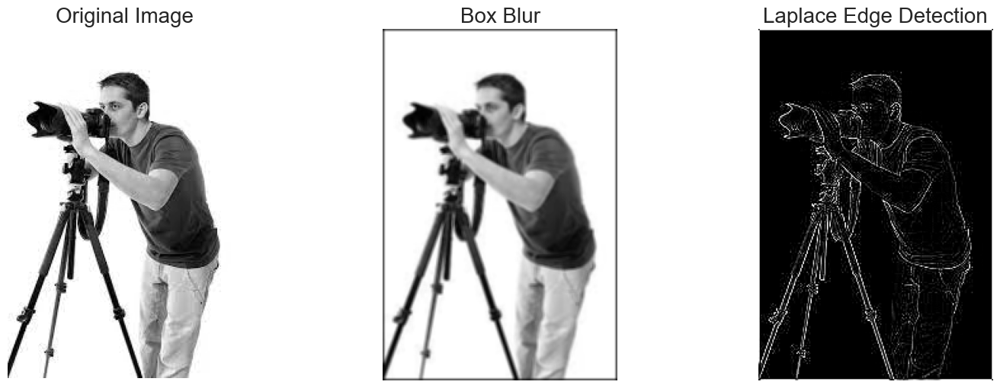

In [100]:
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18, 6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')



```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/yu.png
---
height: 200px
name: directive-fig
---
Ilustración de tres filtros/núcleos
```

- Profundidad: La profundidad de una capa es el número de matrices de filtro que se emplean en esta capa. No debe confundirse profundidad de la red, que corresponde al número total de capas ocultas utilizadas. A veces, nos referimos al número de filtros como el número de canales.

- Campo receptivo: Cada píxel de una matriz de características de salida resulta como una media ponderada de los píxeles dentro de un área específica de la matriz de imágenes de entrada (o de la salida de la capa anterior). El área específica que corresponde a un píxel se conoce como su campo receptivo.

- Deslizamiento: En la práctica, en lugar de deslizar la matriz de filtros de píxel en píxel, se puede deslizar, por ejemplo, $s$ píxeles. Este valor se conoce como stride. Para valores de $s>1$, se obtienen matrices de mapas de características de menor tamaño.

- Relleno de ceros: A veces, se utilizan ceros para rellenar la matriz de entrada alrededor de los píxeles del borde. De esta forma, la dimensión de la matriz aumenta. Si la matriz original tiene dimensiones.

- Se puede ajustar el tamaño de una matriz de mapa de características de salida ajustando el valor del stride,$s$, y el número de columnas y filas cero adicionales en el relleno. En general, se puede comprobar fácilmente que si $H \in R^{mxm}$ e  $I \in R^{lxl}$ y $p$ es el número de filas y columnas adicionales para el relleno, entonces el mapa de características tiene dimensiones $k$ x $k$, donde: 

$$k=\left \lfloor \frac{l+2p-m}{s} +1 \right \rfloor$$

y  $$\left \lfloor . \right \rfloor$$ es el operador suelo. 

#### El paso de la no linealidad

Una vez que se han realizado las convoluciones y se ha añadido el término de sesgo a todos los valores del mapa de características, el siguiente paso es aplicar una no linealidad (función de activación) a cada uno de los píxeles de cada matriz de mapas de características.Actualmente, la función de activación lineal rectificada, ReLU, parece ser la más popular.


```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/nolineal.png
---
height: 200px
name: directive-fig
---
No linealidad
```

#### La etapa de agrupación

El objetivo de este paso es reducir la dimensionalidad de cada matriz de mapas de características. A veces, el paso también se denomina pooling espacial.  Para ello, se define una ventana y se desliza sobre la matriz correspondiente. El deslizamiento puede realizarse adoptando un valor para el respectivo parámetro stride, $s$ . La operación de pooling consiste en elegir un único valor para representar todos los píxeles que se encuentran dentro de la ventana. La operación más utilizada es la agrupación máxima; es decir, entre todos los píxeles que se encuentran dentro de la ventana, el que tiene el valor más alto es seleccionado. Otra posibilidad es la agrupación en la que se selecciona el valor medio de todos los píxeles; a veces se denomina pooling de suma.


```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/pooling.png
---
height: 200px
name: directive-fig
---
Agrupamiento
```

La siguiente figura muestra el efecto de aplicar el pooling a la imagen de la izquierda. Sin duda, los bordes se vuelven más gruesos, pero la información relacionada con los bordes puede extraerse. Nótese que después de la agrupación, el tamaño de la matriz imagen es reducido. Desde otro punto de vista, el polling resume las estadísticas dentro del área pooling. El pooling puede considerarse un tipo especial de filtrado, en el que, en lugar de la convolución, se selecciona el valor máximo (o medio) de la imagen. El pooling ayuda a que la representación sea aproximadamente invariante a pequeñas traslaciones de la entrada.

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/pooling_invariant.png
---
height: 200px
name: directive-fig
---
Agrupamiento invariante
```


#### Convolución sobre volúmenes

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/cnnn.png
---
height: 200px
name: directive-fig
---
CNN
```


Supongamos que la entrada es un volumen de **I** de $l*l*d$. Nótese que, éste comprende  $d$ imágenes, digamos, ** $I_r$ ** , $r=1,2,...d$  cada una de ellas de dimensiones $l*l$. Sea **H** el filtro volumen de $m*m*d$. Este último comprende el conjunto de $d$ imágenes, ** $H_r$ **, $r=1,2,...d$, cada una de dimensiones $m*m$. A continuación, la operación de convolución se define mediante los siguientes pasos:

-  Convolucionar las correspondientes matrices de imágenes bidimensionales para generar $d$ matrices bidimensionales de salida, es decir:

<div style="text-align: center;">

$O_r=I_r \star H_r$,     r=1,2,...,d
    
</div> 

- La convolución de los dos volúmenes, **I** y **H** se define como: 

<div style="text-align: center;">

$\sum_{r=1}^{d}O_r$
    
</div> 

En otras palabras, al convolución de dos volúmenes da como resultado una matriz bidimensional

<div style="text-align: center;">

3D volúmen $\star$ 3D volúmen = 2D array
    
</div>

#### Arquitectura CNN completa

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/imagenes/cnncom.png
---
height: 200px
name: directive-fig
---
Arquitectura de una CNN completa
```

En la primera capa se emplea un número de volúmenes de filtro (canales) para realizar convoluciones seguidas de la operación no lineal. A continuación, la etapa de pooling toma el relevo para reducir la altura y la anchura de cada volumen de salida, que se utiliza como entrada de la segunda capa, y así sucesivamente. Por último, el volumen de salida de la última capa se vectoriza. A veces, esto también se denomina operación de aplanamiento (flattening: En otras palabras, todos los elementos del volumen de salida se apilan uno debajo de otro para formar un vector)

### Metodologia

#### Descripción de población y muestra

Para el desarrollo del presente proyecto, se eligió un conjunto de datos que contiene imágenes de espectrogramas previamente procesados, disponibles en el sitio web Kaggle {cite}`kaggle_data`. Los audios utilizados para generar los espectrogramas, fueron obtenidos del sitio web **Xeno-Canto**, en el cual se encuentran registros de sonidos de toda clase de fauna alrededor del mundo. Los audios con los cantos de las aves fueron convertidos en espectrogramas utilizando una transformada de Fourier de tamaño 2048 y luego se les aplicó una transformación logarítmica.

Los espectrogramas consisten en una representación visual que muestra cómo se distribuyen las frecuencias en una señal de sonido. Esta representación gráfica puede revelar detalles específicos, como frecuencias elevadas o cambios en la amplitud, que podrían no ser perceptibles incluso si se encuentran dentro del rango auditivo humano {cite}`espectguill`. 

La muestra inicial de datos para este proyecto son espectrogramas de 152 especies de aves de la población total de especies de aves presentes en Hawaii, y no se tiene información temporal con respecto al momento en que se registraron los audios.

Durante la realización del análisis exploratorio, y por limitaciones para aplicar técnicas de balanceo de datos, se seleccionan como muestra las 6 especies con mayor cantidad de datos.

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/img_esp.png
---
height: 150px
name: directive-fig
---
Especie Loxops caeruleirostris (Akeke) junto a su espectograma
```





#### Diccionario de variables

Los datos utilizados en el proyecto son imágenes de espectrogramas de 152 especies de aves presentes en Hawái. Como se verá más adelante, la cantidad de espectrogramas para cada especie no es igual, por lo que estamos ante un conjunto de datos desbalanceado.

* **Variable dependiente**: Etiquetas con la abreviatura del nombre común de las aves.
* **Variables explicativas**: Vector de características extraídas de imágenes de espectrogramas del espectro de frecuencias de la emisión sonora del canto de las aves.

Los espectogramas, se utilizaron para extraer patrones visuales y características importantes presentes en las imágenes, que permitan identificar las especies de aves. Estas caracteristicas son extraidas al momento de implementar los modelos, y no se tienen de antemano.

Algunas de las caracteristicas extraíadas de los espectrogramas por los modelos son:

* **Estadísticas de color**: Los estadísticos de distribución de color son comunes en la recuperación de imágenes, ya que describen la variación de la intensidad del color en una imagen. En el caso de los espectrogramas de sonido, estos estadísticos se aplican a cada imagen monocroma, permitiendo describir cómo varía la intensidad del sonido en regiones definidas en términos de tiempo y frecuencia. {cite}`color1`
* **Direccionalidad**: La direccionalidad de la imagen es una característica importante para describir la textura de una imagen. Describe la dirección en la que se concentra o dispersa la textura de la imagen. {cite}`direc2`






#### Técnicas

Para el desarrollo de este modelo se implementaron los siguientes algoritmos de aprendizaje automatico:
* Convolutional Neural Network (CNN)
* Aprendizaje por trasnferencia con MobileNetV2
* Convolutional Neural Network con Algoritmo Genetico (GA)

#### Diseño general

El tipo de diseño de investigación utilizado en este trabajo es Mineria de datos. Las etapas consideradas durante el desarrollo del trabajo fueron: 
* Extracción de datos
* Análisis exploratorio de los datos
* Procesamiento de datos
* Modelado
* Evaluación de resultados

#### Validez

### Resultados y Discusiones

#### Exploración de los datos

Para la exploración de los datos, se utilizaron los audios originales con los cuales se generaron los espectogrmas, ya que estos nos podrian ayudar a entender las diferencias entre los cantos de las aves, y como esto puede ayudar a identificarlas. 


In [37]:
import os
import pandas as pd
import torch
import torchaudio
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import librosa
import librosa.display
import IPython.display as ipd
import sklearn
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')

In [38]:
#Metadata de los audios
train_csv=pd.read_csv('C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/train_metadata.csv')
train_csv.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg


La información de la metadata del conjunto de datos, tiene información sobre el tipo de canto de la especie (llamado, canción, alerta), las coordenadas en las cuales se realizó la grabación del audio, quien fue el autor de la grabación, la duración de la grabación, entre otros datos. Esta información no será utilizada en el modelo, pero permite conocer un poco más sobre el contexto de los audios.

In [39]:
# Muestra de audios
base_dir = 'C:/Users/kaes1/Desktop/MachineLearningUN/Audios/train_audio'
train_csv['full_path'] = base_dir+ '/' + train_csv['filename']
# train_csv['full_path'] = base_dir+ '/' + train_csv['primary_label'] + '/' + train_csv['filename']
brnowl = train_csv[train_csv['primary_label'] == "brnowl"].sample(1, random_state = 33)['full_path'].values[0]
comsan = train_csv[train_csv['primary_label'] == 'comsan'].sample(1, random_state = 33)['full_path'].values[0]
houspa = train_csv[train_csv['primary_label'] == "houspa"].sample(1, random_state = 33)['full_path'].values[0]
mallar3 = train_csv[train_csv['primary_label'] == 'mallar3'].sample(1, random_state = 33)['full_path'].values[0]
norcar = train_csv[train_csv['primary_label'] == 'norcar'].sample(1, random_state = 33)['full_path'].values[0]
skylar = train_csv[train_csv['primary_label'] == 'skylar'].sample(1, random_state = 33)['full_path'].values[0]
birds= ["brnowl", "comsan", "houspa", "mallar3", "norcar",'skylar']

* **Muestra de audios**

Para entender porque los cantos de las aves pueden ayudar en la identificación de especies, se muestran a continuación algunos ejemplos de audio obtenidos desde el repositorio de Xeno-canto.

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/skylar.jpg
---
height: 150px
name: directive-fig
---
Especie Alauda arvensis (skylar)
```

In [40]:
ipd.Audio(skylar)

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/houspa.jpg
---
height: 150px
name: directive-fig
---
Especie Passer domesticus (houspa)
```

In [41]:
ipd.Audio(houspa)

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/comsan.jpg
---
height: 150px
name: directive-fig
---
Especie Actitis hypoleucos (comsan)
```

In [42]:
ipd.Audio(comsan)

In [43]:
y_brnowl, sr_brnowl = librosa.load(brnowl)
audio_brnowl, _ = librosa.effects.trim(y_brnowl)

y_comsan, sr_comsan = librosa.load(comsan)
audio_comsan, _ = librosa.effects.trim(y_comsan)

y_houspa , sr_houspa  = librosa.load(houspa)
audio_houspa , _ = librosa.effects.trim(y_houspa)

y_mallar3, sr_mallar3 = librosa.load(mallar3)
audio_mallar3, _ = librosa.effects.trim(y_mallar3)

y_norcar, sr_norcar = librosa.load(norcar)
audio_norcar, _ = librosa.effects.trim(y_norcar)

y_skylar, sr_skylar = librosa.load(skylar)
audio_skylar, _ = librosa.effects.trim(y_skylar)

Para una muestra de 6 especies, se grafican las ondas sonoras extraídas de los audios. Aqui se observa que los audios tienen diferentes duraciones, desde segundos hasta minutos, y que la amplitud y frecuencia de las ondas es diferente de una especie a otra.

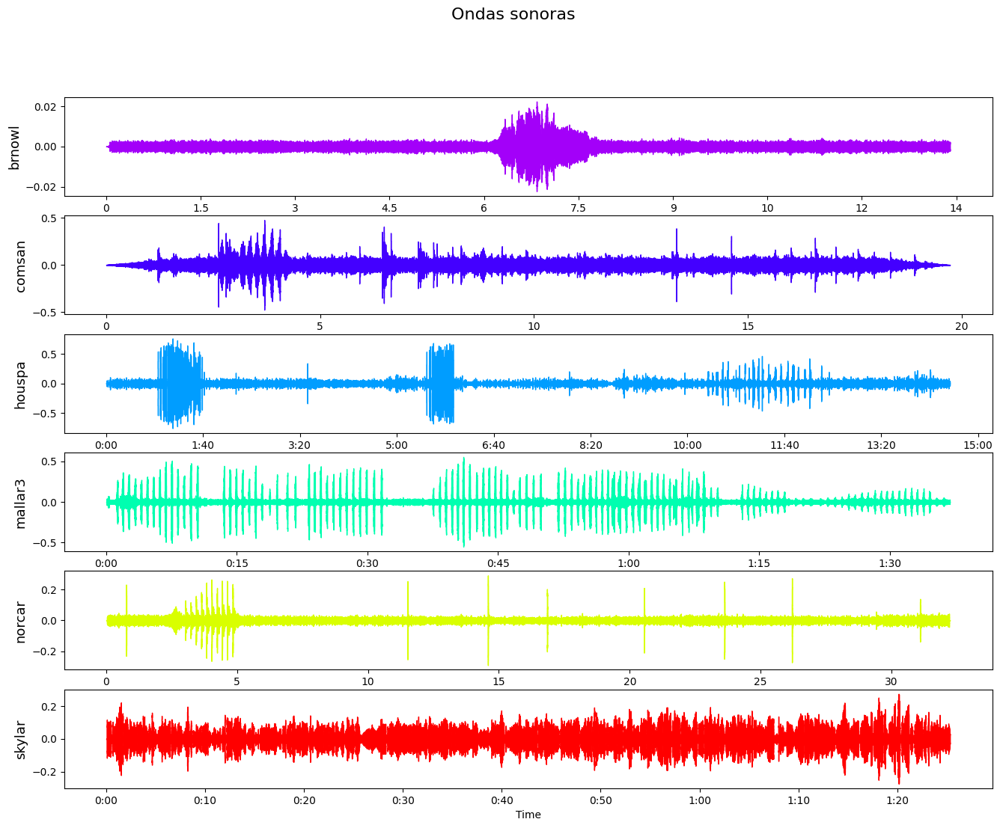

In [44]:
# graficas de señales de audio
fig, ax = plt.subplots(6, figsize = (16, 12))
fig.suptitle('Ondas sonoras', fontsize=16)
# birds= ["brnowl", "comsan", "houspa ", "mallar3", "norcar",'skylar']
librosa.display.waveshow(y = audio_brnowl, sr = sr_brnowl, color = "#A300F9", ax=ax[0])
librosa.display.waveshow(y = audio_comsan, sr = sr_comsan, color = "#4300FF", ax=ax[1])
librosa.display.waveshow(y = audio_houspa , sr = sr_houspa , color = "#009DFF", ax=ax[2])
librosa.display.waveshow(y = audio_mallar3, sr = sr_mallar3, color = "#00FFB0", ax=ax[3])
librosa.display.waveshow(y = audio_norcar, sr = sr_norcar, color = "#D9FF00", ax=ax[4])
librosa.display.waveshow(y = audio_skylar, sr = sr_skylar, color = "r", ax=ax[5]);

for i, name in zip(range(6), birds):
    ax[i].set_ylabel(name, fontsize=13)

* **Distribución de los datos**

Text(0, 0.5, 'Frequencia')

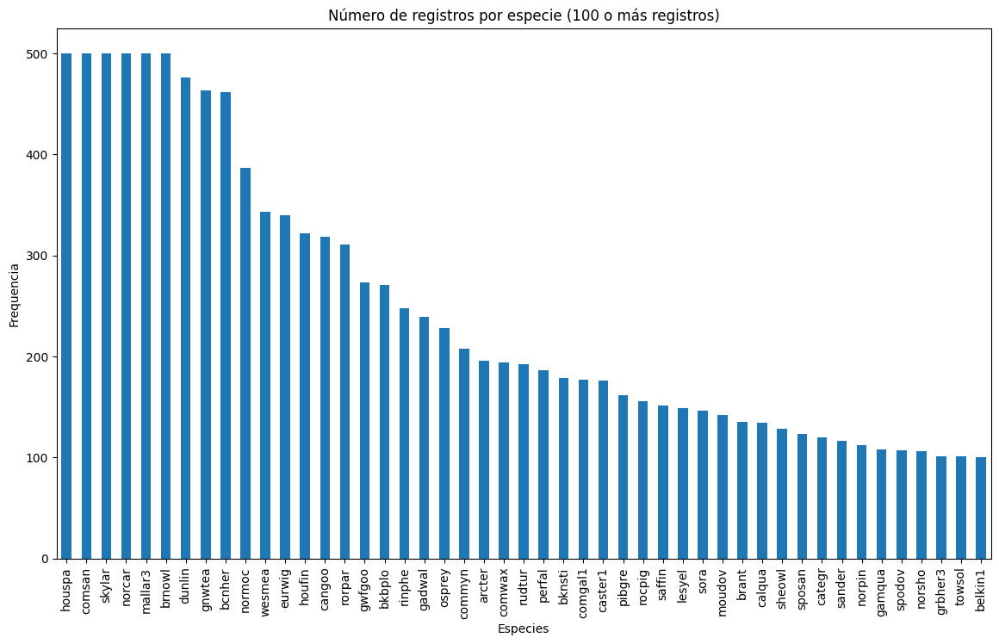

In [45]:
ax = train_csv.groupby('primary_label').filter(lambda x: len(x) >= 100 )['primary_label'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Número de registros por especie (100 o más registros)")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

En el gráfico de barras se visualizan aquellas especies con 100 o más muestras de espectogramas. Solo 47 de las 152 especies tienen 100 o mas espectrogramas en el conjunto de datos.

Text(0, 0.5, 'Frequencia')

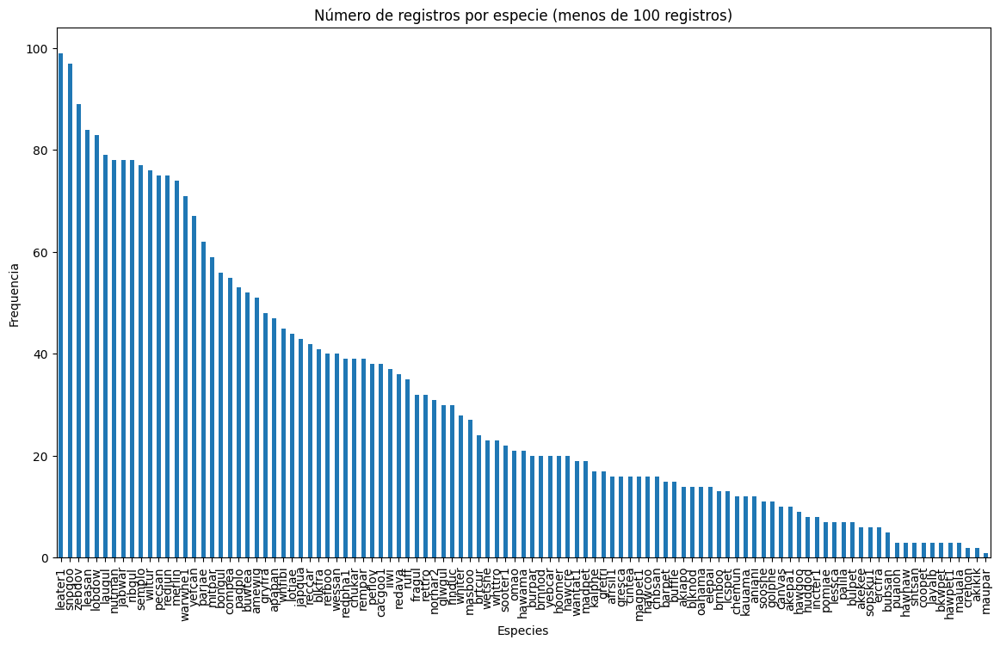

In [46]:
ax = train_csv.groupby('primary_label').filter(lambda x: len(x) < 100 )['primary_label'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Número de registros por especie (menos de 100 registros)")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

Se puede observar, que la gran mayoría de especies cuentan con menos de 100 espectrogramas en el conjuntos de datos, algunas incluso tienen menos de 10 especies, lo que indica que el conjunto de datos esta considerablemente desbalanceado.

En el siguiente gráfico se puede ver el rating o puntaje que tienen los audios en el sitio web de Xeno-canto. Este puntaje indica que tan buena es la grabación del canto de la ave (puntaje dado por la comunidad). La mayoría de los audios, tienen un puntaje igual o superior a 3, por lo que se puede considerar que la muestra de datos es representativa de los cantos de las especies, y por lo tanto, aptos para ser usados en el entrenamiento del modelo (por consiguiente, los espectrogramas generados deben ser aptos tambien).

Text(0, 0.5, 'Frequencia')

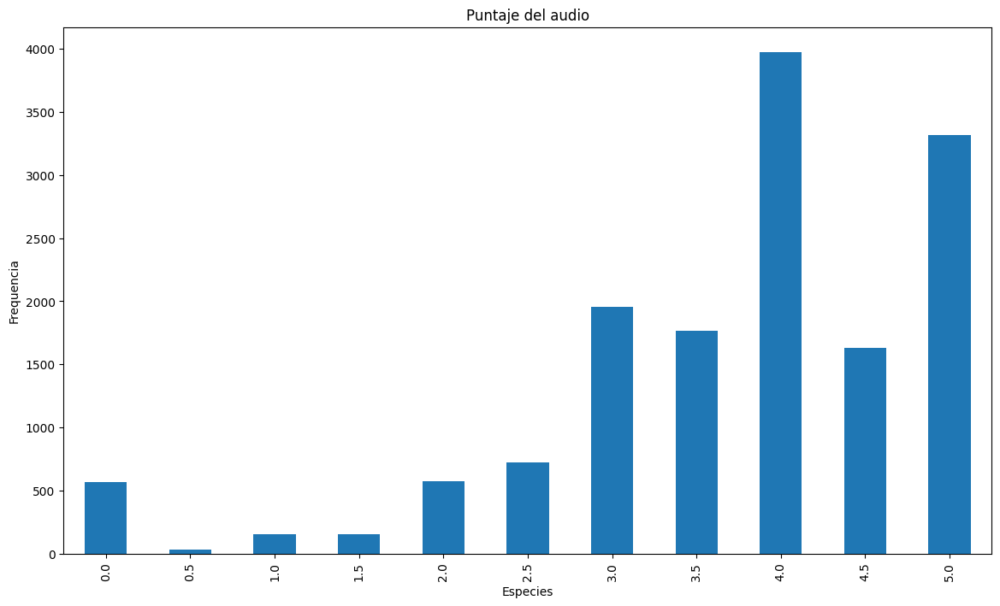

In [47]:
ax = train_csv.groupby('rating')['rating'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Puntaje del audio")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

* **Dimensión de las imágenes**

Debido a que las imágenes de los espectrogramas están a color, tienen 3 canales de color (red, green, blue). Las imágenes no tienen el mismo tamaño, ya que difieren en el ancho, mientras que la altura es igual para todas. Debido a las imágenes deben tener las mismas dimensiones antes de convertirlas en matrices de datos, se deben escalar todas al mismo tamaño. Esto se realiza en la etapa de preprocesamiento previa a la implementación de modelo.

In [48]:
IMG_DIR = 'C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/Pruebas/'
especies_list = os.listdir(IMG_DIR)

images = os.listdir(os.path.join(IMG_DIR, especies_list[0]))
for image in images[:10]: 
    image_ = plt.imread(os.path.join(IMG_DIR, especies_list[0], image))
    print(image_.shape)        

(1025, 255, 3)
(1025, 2002, 3)
(1025, 692, 3)
(1025, 737, 3)
(1025, 1606, 3)
(1025, 359, 3)
(1025, 1307, 3)
(1025, 4772, 3)
(1025, 6568, 3)
(1025, 1005, 3)


#### Balanceo de datos

Para realizar balanceo de datos en imagenes, por lo general se emplean técnicas que involucran desplazar, ampliar, reducir, girar, voltear, distorsionar o sombrear algunas de las imagenes del conjunto de entrenamiento, con el fin de añadir ruido y construir un nuevo grupo de datos {cite}`dataaug`. Acorde a la literatura, se cita que, en el caso de los espectrogramas, aún cuando son imágenes, no es adecuado aplicar este tipo de técnicas para generar nuevos datos, debido a que podrían contaminar la información contenida en la imagen. Un ejemplo de esto, es que al girar la imagen de un espectograma, ya no tendria relación con el audio real, e información como la frecuencia o la amplitud de la onda sonora de los audios, deja de ser representativa de la especie.

Por lo tanto, el balanceo de datos se tendría que realizar sobre los audios originales a partir de los cuales se generó el conjunto de imágenes de espectrogramas, o sobre los espectrogramas extraídos de los audios, antes de generar las imágenes. Para el caso de los audios, existen diferentes tipos de técnicas, como ruido Gaussiano, desplazamiento de tono y estiramiento temporal {cite}`auaug`, que permiten crear datos sintenticos adecuados para robusteser los modelos de aprendizaje automatico.  

Tomando uno de los audios obtenidos desde Xeno-canto, se ilustra cómo sería el proceso de balanceo de datos utilizando la técnica de añadir rudio Gaussiano (Gaussian noise) al audio, con el audio de la especie norcar (*Cardinalis cardinalis*). El ruido Gaussiano sigue una distribución normal (Gaussiana), el cual será introducida al audio original de la especie, considerando tambien un valor de amplitud (σ).


In [49]:
ipd.Audio(norcar)

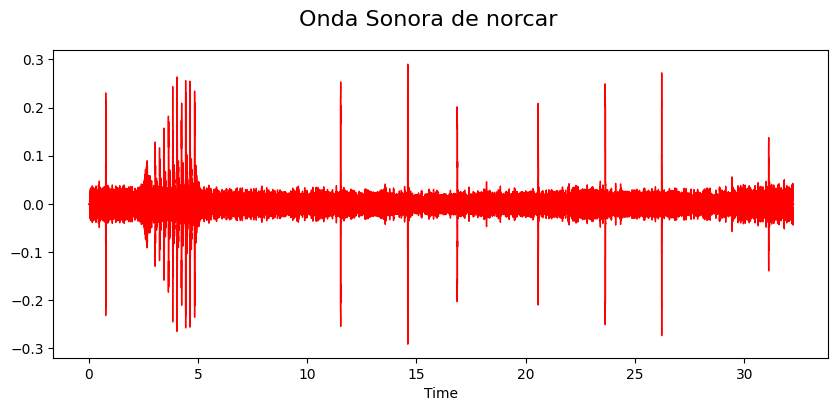

In [50]:
fig, ax = plt.subplots(1, figsize = (10, 4))
fig.suptitle('Onda Sonora de norcar', fontsize=16)
librosa.display.waveshow(y = audio_norcar, sr = sr_norcar, color = "r")

A continuación, se añade rudio Gaussiano al audio, el cual ayuda a simular ruido ambiente en la grabación. Se considera una aplitud de 0.01, para que sea mas evidente el efecto del rudio Gaussiano en el audio, pero lo ideal es encontrar el valor adecuado de amplitud (σ), que permita robustecer el modelo sin afectar su desempeño.

In [51]:
# Añadir ruido blanco
wn = np.random.randn(len(audio_norcar))
data_wn = audio_norcar+ 0.01*wn
ipd.Audio(data_wn, rate=22050)

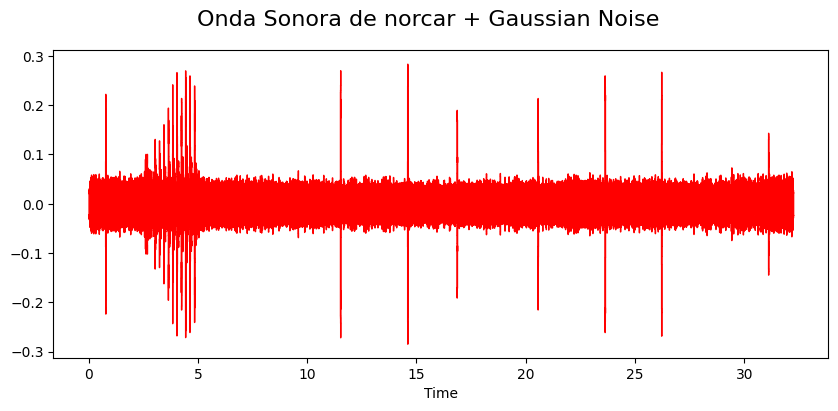

In [52]:
fig, ax = plt.subplots(1, figsize = (10, 4))
fig.suptitle('Onda Sonora de norcar + Gaussian Noise', fontsize=16)
librosa.display.waveshow(y = data_wn, sr = sr_norcar, color = "r")

Se evidencia el cambio en la onda sonora del audio al introducir ruido Gaussiano en la muestra original.

Para el desarrollo del presente trabajo, no fue posible la implementación de técnicas de balanceo, debido a que el conjunto de datos a utilizar, ya son imagenes preprocesadas, y no los audios en sí. 

Debido a que trabajar con la muestra total de datos, la cual está considerablemente desbalanceada, podria dificultar el desarrollo y desempeño de los modelos, se decide escoger un subcojunto del conjunto de datos. Este subconjunto está conformado por las 6 especies con mayor cantidad de datos, las cuales cuentan con 500 muestras de espectrogramas cada una.


#### Selección de métrica

La métrica seleccionada para evaluar los modelos es **Accuracy (Exactitud)**. Se escoge esta métrica debido a que se tiene una proporción igual de datos para cada especie (categoría), y no hay una prioridad en identificar una especie sobre las otras, ya que interesa que el modelo sea capaz de identificar lo mejor posible cada una de las especies, en la misma medida.

#### Implementación de modelo

Las especies que se van a utilizar para entrenar el modelo son: **'brnowl', 'comsan', 'houspa', 'mallar3', 'norcar', 'skylar'**

Previo a la implementación de los modelos, fue necesario convertir las imagenes de los espectogramas para las 6 especies en arreglos matrciales 

In [53]:
from tensorflow.keras.preprocessing import image

especies_list = list(train_csv.groupby('primary_label').filter(lambda x: len(x) >= 480 )['primary_label'].value_counts().index)

def load_images_from_path(path, label):
    images = []
    labels = []

    for file in os.listdir(path):
        images.append(image.img_to_array(image.load_img(os.path.join(path, file), target_size=(224, 224, 3))))
        labels.append((label))
        
    return images, labels

def show_images(images):
    fig, axes = plt.subplots(1, 8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i] / 255)
        
x = []
y = []

En la siguiente figura se pueden visualizar los espectrogramas para las seis especies que se van a clasificar. Los espectrogramas fueron procesados y se modificaron las dimensiones de altura y ancho, para que todas las imágenes tengan las mismas dimeniones de 224 x 224.

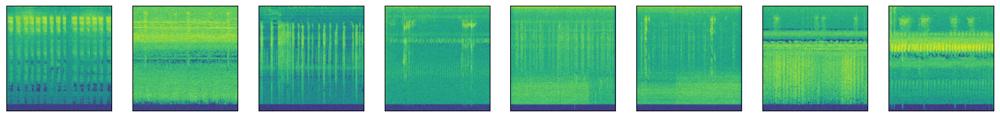

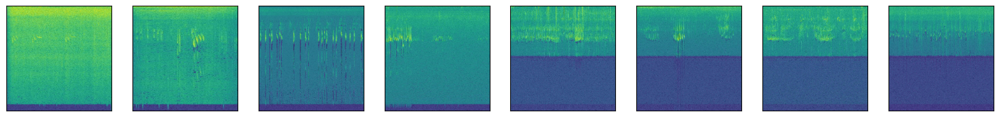

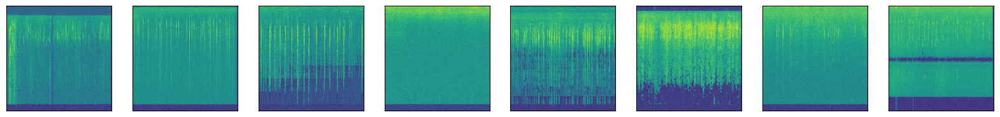

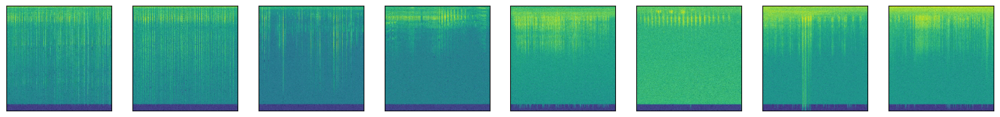

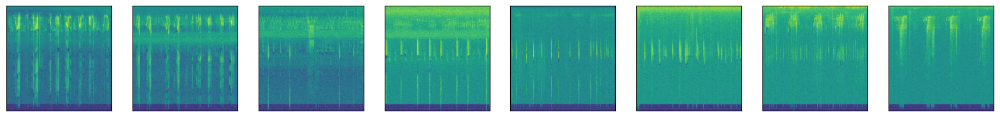

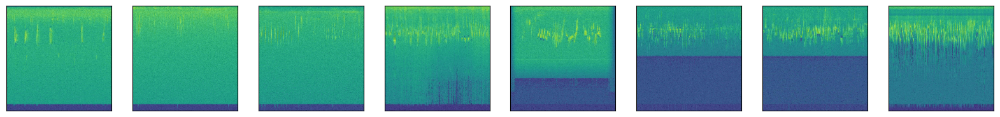

In [54]:
NUEVO_DIR = 'C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/Pruebas'
label = 0
for folder in especies_list:
    images, labels = load_images_from_path(os.path.join(NUEVO_DIR, folder), label)
    show_images(images)
        
    x += images
    y += labels
    label = label + 1

In [55]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

x_trainval, x_test, y_trainval, y_test = train_test_split(x, y, stratify=y, test_size=0.2, random_state=0)
x_train, x_val, y_train, y_val = train_test_split(x_trainval, y_trainval, stratify=y_trainval, test_size=0.2, random_state=0)

x_train_norm = np.array(x_train) / 255
x_val_norm = np.array(x_val) / 255
x_test_norm = np.array(x_test) / 255

y_train_encoded = to_categorical(y_train)
y_val_encoded = to_categorical(y_val)
y_test_encoded = to_categorical(y_test)

N_CLASSES = len(especies_list)
N_CLASSES

6

Para la preparación de los datos, se dividió el conjuntos de datos en 3 subconjuntos: entrenamiento, validación y prueba. 
La división de datos se hizo de manera estratificada, asegurando que se mantenga la proporción de datos por especie en todos los subconjuntos de datos.

Tamaños de los conjuntos de datos:

* Entrenamiento: 1920
* Validación: 480
* Prueba: 600

Luego de dividir los dato, se normalizan las características de entrada dividiendo cada valor de píxel por 255. Esto escala los valores de píxel en el rango [0, 1].

In [88]:
x_train_norm_k = x_train_norm.reshape(x_train_norm.shape[0], -1)
x_test_norm_k=x_test_norm.reshape(x_test_norm.shape[0], -1)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

x_train_norm_k = x_train_norm.reshape(x_train_norm.shape[0], -1)
x_test_norm_k=x_test_norm.reshape(x_test_norm.shape[0], -1)

best_score=0
for n_n in range(1,20,1):
    print(n_n)
    knn = KNeighborsClassifier(n_neighbors=n_n)# Entrena SVC para cada parámetro
    scores = cross_val_score(knn, x_train_norm_k, y_train, cv=5) # Calcula validación cruzada
    score = np.mean(scores) # Calcula media de la validación cruzada para precisión
    if score > best_score:
        best_score = score
        best_parameters = {'n_neighbors': n_n}


In [89]:
from sklearn.neighbors import KNeighborsClassifier

# X_train_= scaler.fit_transform(x_train_norm, y_train_encoded)    
reg = KNeighborsClassifier(n_neighbors=15)
reg.fit(x_train_norm_k, y_train)
# Ahora a los datos de validación
# X_test_=scaler.transform(X_test)
# y_pred = reg.predict(x_test_norm)

KNeighborsClassifier(n_neighbors=15)

Text(110.44999999999997, 0.5, 'Actual label')

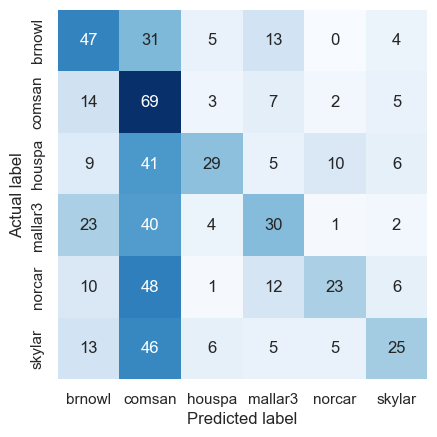

In [90]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
sns.set()

y_pred = reg.predict(x_test_norm_k)
# y_predicted = model.predict(test_features)
mat = confusion_matrix(y_test, y_pred)
class_labels = especies_list

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False, cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel('Predicted label')
plt.ylabel('Actual label')

* Red Neuronal Convolucional

El primer modelo entrenado, consiste en una red neuronal convolucional con la siguiente arquitectura:

In [56]:
# Crear CNN model
import tensorflow as tf
from keras import regularizers

weight_decay = 1e-4
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(224, 224, 3)))
model.add(tf.keras.layers.Conv2D(32, 3, strides=1, padding='same', activation='relu',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Conv2D(128, 3, padding='same', activation='relu',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
model.add(tf.keras.layers.Dropout(0.4))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(N_CLASSES, activation='softmax'))

# Compilar modelo
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy'],
)



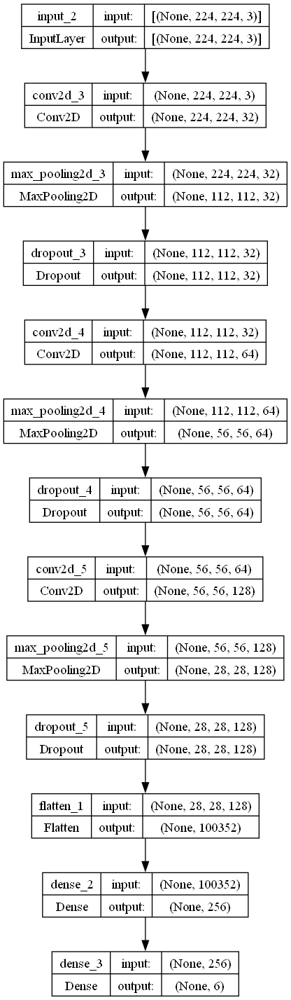

In [57]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

En la arquitectura planteada, se tiene una secuencia de varias capas convolucionales para extraer características de las imágenes, capas de agrupación para reducir la resolución, capas de dropout para reducir el sobreajuste y capas densas para la clasificación final. El regularizador L2 se utiliza para controlar el sobreajuste.

In [58]:
# Entrenar modelo por 10 epocas, capturar history
history = model.fit(x_train_norm, y_train_encoded, epochs=10, validation_data=(x_val_norm, y_val_encoded), batch_size=32)

Epoch 1/10
60/60 [==============================] - 101s 2s/step - loss: 2.6713 - accuracy: 0.1547 - val_loss: 1.8044 - val_accuracy: 0.1708
Epoch 2/10
60/60 [==============================] - 95s 2s/step - loss: 1.8041 - accuracy: 0.1542 - val_loss: 1.8001 - val_accuracy: 0.1688
Epoch 3/10
60/60 [==============================] - 92s 2s/step - loss: 1.7934 - accuracy: 0.2062 - val_loss: 1.7756 - val_accuracy: 0.1979
Epoch 4/10
60/60 [==============================] - 104s 2s/step - loss: 1.7386 - accuracy: 0.2667 - val_loss: 1.6578 - val_accuracy: 0.3354
Epoch 5/10
60/60 [==============================] - 103s 2s/step - loss: 1.4474 - accuracy: 0.4005 - val_loss: 1.3133 - val_accuracy: 0.5271
Epoch 6/10
60/60 [==============================] - 99s 2s/step - loss: 1.2276 - accuracy: 0.5276 - val_loss: 1.0456 - val_accuracy: 0.6167
Epoch 7/10
60/60 [==============================] - 115s 2s/step - loss: 1.0580 - accuracy: 0.5979 - val_loss: 0.8575 - val_accuracy: 0.6833
Epoch 8/10
60/60

[]

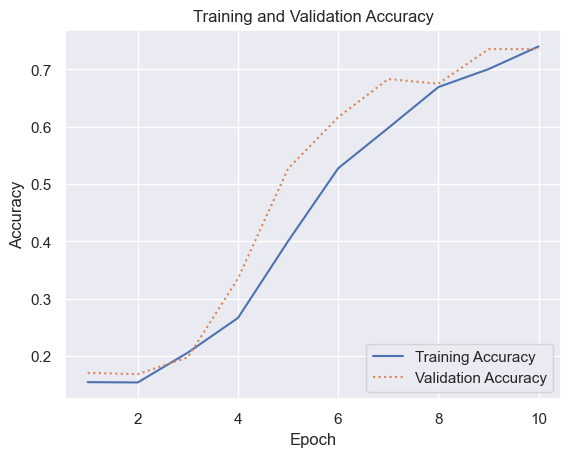

In [63]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training Accuracy')
plt.plot(epochs, val_acc, ':', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

[]

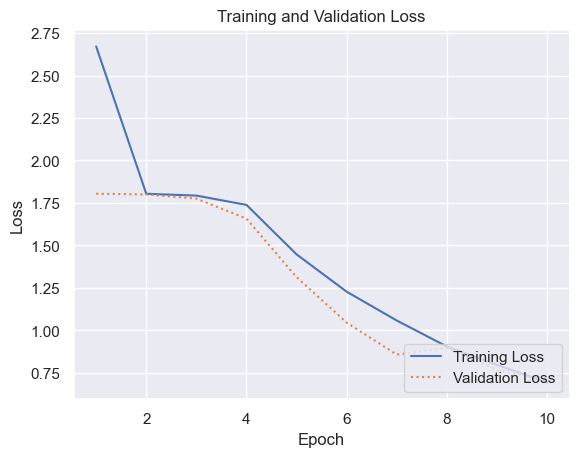

In [64]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, '-', label='Training Loss')
plt.plot(epochs, val_loss, ':', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.plot()

19/19 [==============================] - 4s 202ms/step


Text(110.44999999999997, 0.5, 'Actual label')

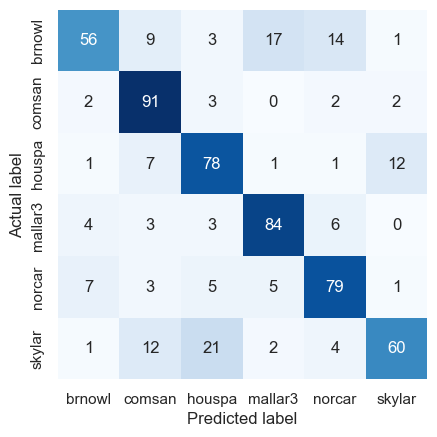

In [65]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
sns.set()

y_predicted = model.predict(x_test_norm)
mat = confusion_matrix(y_test_encoded.argmax(axis=1), y_predicted.argmax(axis=1))
class_labels = especies_list

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False, cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel('Predicted label')
plt.ylabel('Actual label')

In [66]:
# Compute the final loss and accuracy
final_loss, final_acc = model.evaluate(x_test_norm, y_test_encoded, verbose=0)
print("Final loss: {0:.6f}, final accuracy: {1:.6f}".format(final_loss, final_acc))

Final loss: 0.786547, final accuracy: 0.746667


* Aprendizaje por transferencia con MobileNetV2

El siguiente modelo a evaluar consiste en implementar el aprendizaje por transferencia a través del modelo de CNN MobileNetV2. MobileNetV2 es una red neuronal convolucional on 53 capas de profundidad, la cual está preentrenada y optimizada para su uso en dispositivos móviles, diseñada para extraer características de las imágenes de espectrogramas. Se utiizó este modelo principalmente por ser ligero para su implementación en dispositivos sin GPU, y por los buenos resultados que ha tenido en otras aplicaciones.

In [78]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet import preprocess_input

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x_train_norm_ = preprocess_input(np.array(x_train))
x_test_norm_ = preprocess_input(np.array(x_test))
x_val_norm_ = preprocess_input(np.array(x_val))

train_features = base_model.predict(x_train_norm_)
test_features = base_model.predict(x_test_norm_)
val_features = base_model.predict(x_val_norm_)

15/15 [==============================] - 8s 494ms/step


La aquitectura planteado para el aprendizaje por transferencia es la siguiente:

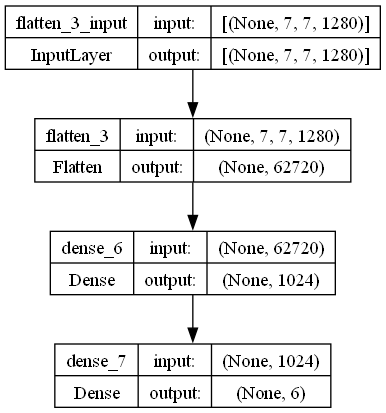

In [79]:
model2 = tf.keras.models.Sequential()
model2.add(tf.keras.layers.Flatten(input_shape=train_features.shape[1:]))
model2.add(tf.keras.layers.Dense(1024, activation='relu'))
model2.add(tf.keras.layers.Dense(N_CLASSES, activation='softmax'))
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Compile model
model2.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy'],
)

plot_model(model2, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

En resumen, esta arquitectura toma un vector de características de entrada, lo aplana, lo pasa a través de una capa completamente conectada con activación ReLU, y luego lo conecta a la capa de salida con activación softmax para producir las probabilidades de pertenencia a cada clase en un problema de clasificación. El vector de características de entrada para este caso, fue extraido por medio de la trasnferencia de conocimiento con el modelo MobileNetV2.

In [80]:
hist = model2.fit(train_features, y_train_encoded, validation_data=(val_features, y_val_encoded), batch_size=32, epochs=10)

Epoch 1/10
60/60 [==============================] - 14s 231ms/step - loss: 11.9188 - accuracy: 0.5484 - val_loss: 0.9473 - val_accuracy: 0.7500
Epoch 2/10
60/60 [==============================] - 12s 194ms/step - loss: 0.3883 - accuracy: 0.8797 - val_loss: 0.9971 - val_accuracy: 0.7583
Epoch 3/10
60/60 [==============================] - 11s 191ms/step - loss: 0.1529 - accuracy: 0.9536 - val_loss: 0.7140 - val_accuracy: 0.8021
Epoch 4/10
60/60 [==============================] - 11s 189ms/step - loss: 0.0427 - accuracy: 0.9896 - val_loss: 0.7140 - val_accuracy: 0.8208
Epoch 5/10
60/60 [==============================] - 11s 191ms/step - loss: 0.0164 - accuracy: 0.9979 - val_loss: 0.7022 - val_accuracy: 0.8188
Epoch 6/10
60/60 [==============================] - 11s 190ms/step - loss: 0.0059 - accuracy: 1.0000 - val_loss: 0.7106 - val_accuracy: 0.8208
Epoch 7/10
60/60 [==============================] - 11s 191ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 0.7119 - val_accuracy: 0.822

[]

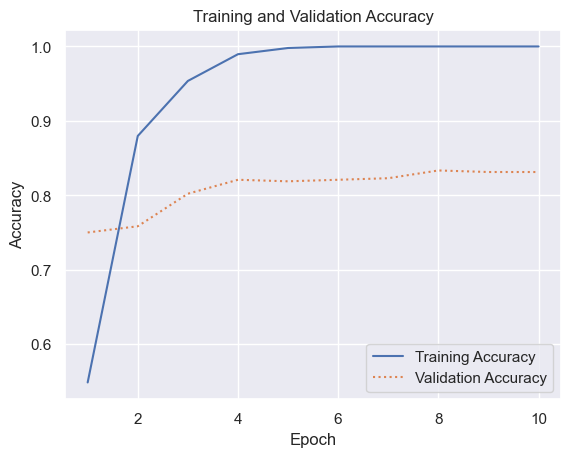

In [81]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training Accuracy')
plt.plot(epochs, val_acc, ':', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

[]

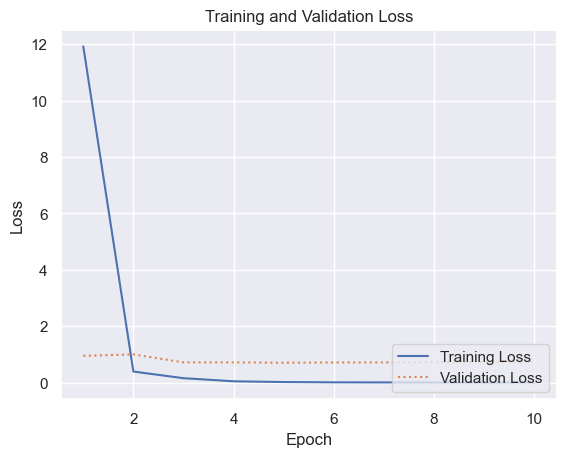

In [82]:
loss = hist.history['loss']
val_loss = hist.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, '-', label='Training Loss')
plt.plot(epochs, val_loss, ':', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.plot()

19/19 [==============================] - 2s 36ms/step


Text(110.44999999999997, 0.5, 'Actual label')

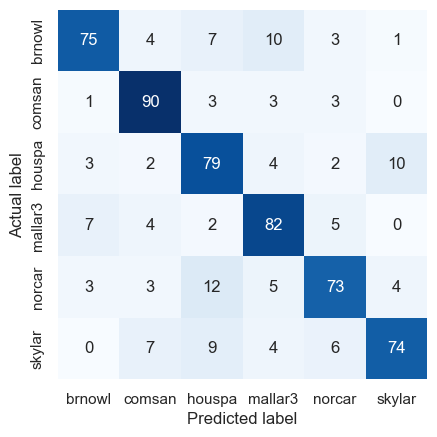

In [86]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
sns.set()

y_predicted = model2.predict(test_features)
mat = confusion_matrix(y_test_encoded.argmax(axis=1), y_predicted.argmax(axis=1))
class_labels = especies_list

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False, cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel('Predicted label')
plt.ylabel('Actual label')

In [87]:
# Compute the final loss and accuracy
final_loss, final_acc = model2.evaluate(test_features, y_test_encoded, verbose=0)
print("Final loss: {0:.6f}, final accuracy: {1:.6f}".format(final_loss, final_acc))

Final loss: 0.865625, final accuracy: 0.788333


#### Discusión

#### Limitaciones 


Durante el desarrollo del proyecto se encontraron las siguientes limitantes, las cuales dificultaron el avance del mismo:
* Las imagenes de los espectrogramas utilizadas, se encontraban originalmente en formato .TIFF, y este formato no nos permitia ejecutar los modelos inicialmente, por temas de compatibilidad, por lo que se realizó un cambio de formato en las imagenes a .JPEG. No se sabe con certeza si este cambio pudo tener efectos en la estructura de las imagenes, y por consiguiente, en las caracteristicas  que se extraen a través de los modelos.
* Se intentó construir el dataset de espectogramas desde cero, utilizando los audios de **Xeno-canto** y aplicando la transformada de Fourier de 2048, pero los resultados obtenidos con los espectogramas generados no fue muy bueno, y algunas imagenes parecian haber perdido información en el proceso de transformación. 


### Conclusiones